In [6]:
#Import required modules
import numpy as np
from matplotlib import pyplot as plt
import cv2
from collections import defaultdict
from scipy.signal import lfilter

# Only for jupyter notebook visualization
%matplotlib inline 

In [7]:
#function to compute euclidian distance between points
def euclidian_distance(point_1,point_2):
    dist = np.sqrt((point_1[0]-point_2[0])**2+(point_1[1]-point_2[1])**2)
    return dist

#function to build table based on model keypoints
def build_r_table(barycentre, src_vector):
    r_table = defaultdict(list)
    for k in range(len(src_vector)):
        j,i=src_vector[k,0]
        r_table[k].append((barycentre[0]-i, barycentre[1]-j, src_vector[k,1]))
    return r_table

#function to cast votes for barycentre position
def accumulate_kp(r_table, Shelf_Image, dst_vector):
    accumulator = np.zeros(Shelf_Image.shape)
    counter=0
    for k in range(len(dst_vector)):
        counter+=1
        j,i=dst_vector[k,0]
        new_size=dst_vector[k,1]
        #each model keypoint has 3 associated scene keypoints
        if(counter==1):
            index=k/3
        #access to corrispondent keypoint of the model
        for r in r_table[k]:
            ratio=new_size/r[2]
            #find new barycentre
            accum_i, accum_j = int(round(i+ratio*r[0])), int(round(j+ratio*r[1]))
            if (0<accum_i < accumulator.shape[0] and 0<accum_j < accumulator.shape[1]):
                accumulator[accum_i, accum_j] += 1
        if(counter==3):
            counter=0
    return accumulator

#function to plot accumulator on a white image and find possible barycentre candidates
def plot_accumulator(accumulator, shelf_image):
    barycentres=[]
    row, col = accumulator.shape
    white = shelf_image.copy()
    white.fill(255)
    #print("image shape: ", white.shape)
    for i in range(row):
        for j in range(col):
            r = 10 
            if(accumulator[i,j]>0):
                white[i,j] = 0
            if(accumulator[i,j]>1):
                if (i + r > row):
                    r = row - i
                elif (i - r <= 0):
                    r = i
                if (j + r > col):
                    r = col - j
                elif (j - r <= 0):
                    r = j

                for k in range(-r+1,r-1):
                    white[i+k,j + k] = 0
                    white[i + k,j - k] = 0
                barycentres.append([i,j])
    plt.figure(figsize=(20, 10))
    plt.imshow(white, cmap='gray', vmin=0, vmax=255)
    plt.show()
    return barycentres

#function to filter barycentres
def distance_filter(barycentres, chosen_distance):
    filtered_bar = []
    L=len(barycentres)
    for first in range(L):
        if (barycentres[first] != [0,0]):
            sum_b = barycentres[first].copy()
            count_b = 1
            next_index=first+1
            if(next_index==L):
                filtered_bar.append(sum_b)
            for second in range(next_index,L):
                dist = euclidian_distance(barycentres[first],barycentres[second])
                if(dist<chosen_distance and barycentres[second] != [0,0] ):
                    sum_b[0] = sum_b[0]+barycentres[second][0]
                    sum_b[1] = sum_b[1]+barycentres[second][1]
                    barycentres[second] = [0,0]
                    count_b += 1
                if second == L-1:
                    sum_b[0] = int(round(sum_b[0] / count_b))
                    sum_b[1] = int(round(sum_b[1] / count_b))
                    filtered_bar.append(sum_b)
    return filtered_bar

#function to recover possible barycentres with few votes
def count_bar(filtered_bar, accumulator, LIMIT):
    row, col = accumulator.shape
    count = 0
    control = False
    for i in range(row):
        for j in range(col):
            if (0<accumulator[i, j]<2 and not [i, j] in filtered_bar):
                start_row = i - LIMIT
                start_col = j - LIMIT
                end_row = i + LIMIT
                end_col = j + LIMIT

                if (end_row > row):
                    end_row = row
                if (start_row < 0):
                    start_row = 0

                if (end_col > col):
                    end_col = col
                if (start_col < 0):
                    start_col = 0

                for n in range(start_row, end_row):
                    for m in range(start_col, end_col):
                        if (accumulator[n, m] > 0):
                            count = count + 1
                        if [n,m] in filtered_bar:
                            control = True
                if count > 2 and not control:
                    filtered_bar.append([i,j])
                control = False
                count = 0
    return filtered_bar

#function to isolate only interesting keypoints
def find_correct_keypoints(bar_found, dst_train_vector, r_table, good, Shelf_Image, LIMIT):
    good_kp=[]
    final_good=[]
    counter=0
    for k in range(len(dst_train_vector)):
        counter+=1
        j,i=dst_train_vector[k,0]
        new_size=dst_train_vector[k,1]
        if(counter==1):
            index=k/3
        #access to corrispondent kp vectors
        for r in r_table[k]:
            ratio=new_size/r[2]
            bar_i, bar_j = int(round(i+ratio*r[0])), int(round(j+ratio*r[1]))
            if (0< bar_i < Shelf_Image.shape[0] and 0<bar_j < Shelf_Image.shape[1]):
                if(bar_found[0]-LIMIT<bar_i<bar_found[0]+LIMIT)and(bar_found[1]-LIMIT<bar_j<bar_found[1]+LIMIT):
                    good_kp=good[k]
                    final_good.append(good_kp)
        if(counter==3):
            counter=0
    return final_good

#function to define names and numbers of given models
def findmodel(i):
    if i == 0:
        print("model 0: Nesquik Azzurro")
        return 0, "NesquikAzzurro"
    elif i == 1:
        print("model 1: ChocoKrave al latte")
        return 1, "CK blue"
    elif i == 2:
        print("model 2: Corn Flakes")
        return 2, "CornFlakes"
    elif i == 3:
        print("model 3: Choko Goal")
        return 3, "ChokoGoal"
    elif i == 4:
        print("model 4: Lim Chocolate")
        return 4, "LimChocolate"
    elif i == 5:
        print("model 5: Nesquik Giallo")
        return 5, "NesquikGiallo"    
    elif i == 6:
        print("model 6: Nesquik Duo")
        return 6, "NesquikDuo"
    elif i == 7:
        print("model 7: CocoPops Brown")
        return 7, "CocoPopsBrown"
    elif i == 8:
        print("model 8: CocoPops Red")
        return 8, "CocoPopsRed"
    elif i == 9:
        print("model 9: Special K blue")
        return 9, "SpecialKBLue"
    elif i == 10:
        print("model 10: Special K Brown")
        return 10, "SpecialKBrown"
    elif i == 11:
        print("model 11: ChocoKrave Nocciole")
        return 11, "CK orange"
    elif i == 12:
        print("model 12: Fitness Orange")
        return 12, "FitnessOrange"
    elif i == 13:
        print("model 13: Fitness Blue")
        return 13, "FitnessBLue"
    elif i == 14:
        print("model 14: Chocapic")
        return 14, "Chocapic"
    elif i == 15:
        print("model 15: CocoPops Yellow")
        return 15, "CocoPopsYellow"
    elif i == 16:
        print("model 16: Miel Pops")
        return 16, "MielPops"
    elif i == 17:
        print("model 17: Miel Pops Orange")
        return 17, "MielPopsOrange"
    elif i == 18:
        print("model 18: Country crisp Brown")
        return 18, "CountrycrispBrown"
    elif i == 19:
        print("model 19: Country crisp Blue")
        return 19, "CountrycrispBlue"
    elif i == 20:
        print("model 20: Special K Red")
        return 20, "SpecialKRed"
    elif i == 21:
        print("model 21: Rice Krispies")
        return 21, "RiceKrispies"
    elif i == 22:
        print("model 22: Cheerios")
        return 22, "Cheerios"
#    elif i == 23:
#        print("model 23: Special K Light-Blue")
#        return 23, "Light_Blue"
           

In [8]:
#Functions used in the colour check of boxes
#find associated channel to a histogram max value
def find_channels(sorted_, original):
    prova_RGB=[]
    for ch in range(3):
        if sorted_[ch]==original[0]:
            prova_RGB.append('r')
        if sorted_[ch]==original[1]:
            prova_RGB.append('g')                        
        if sorted_[ch]==original[2]:
            prova_RGB.append('b')
    return prova_RGB 

#function to compute centre coordinates in the total scene image
def find_total_centre(centre,k):
    if (x_crop[0][1]==0):
        total_centre=(centre[0],centre[1]+x_crop[k][0])
    elif(x_crop[0][1]==1 and k==0):
        total_centre=centre
    elif(x_crop[0][1]==1 and k!=0):
        total_centre=(centre[0],centre[1]+x_crop[k-1][0])
    return total_centre

#function to count pixels of given colours and return their percentage
def find_colour(image, x_1,x_2,y_1,y_2, channel):
    if (channel != 3):
        next_channel=(channel+1)%3
        prev_channel=(channel+2)%3
        counter_color=0
        for j in range(x_1,x_2):
                for i in range(y_1,y_2):
                    if(image[i,j][channel]>100 and image[i,j][next_channel]<100 and image[i,j][prev_channel]<100):
                        counter_color+=1
    else:
        counter_color=0
        for j in range(x_1,x_2):
                for i in range(y_1,y_2):
                    if(80<image[i,j][0]<115 and 25<image[i,j][1]<80 and 25<image[i,j][2]<70):
                        counter_color+=1
    #percentage with respect to the number of pixels in the area
    counter_color=round(100*counter_color/((x_2-x_1)*(y_2-y_1)),2)
    return counter_color

In [9]:
#import all models
n_model=23
query_img = []

for i in range(n_model):
    dir_name_model = "models/" + str(i) + ".jpg"
    query_img.append(cv2.imread(dir_name_model))

#conversion to original colours
model = [cv2.cvtColor(query_img[i],cv2.COLOR_BGR2RGB) for i in range(0,n_model)]

# Blur Images
for i in range(n_model):
    if model[i].shape[1] > 1000:
        model[i] = cv2.GaussianBlur(model[i], (35,35), 0)
    elif model[i].shape[1] > 750:
        model[i] = cv2.GaussianBlur(model[i], (29,29), 0)
    elif model[i].shape[1] > 500:
        model[i] = cv2.GaussianBlur(model[i], (19,19), 0)
    elif model[i].shape[1] > 250:
        model[i] = cv2.GaussianBlur(model[i], (13,13), 0)
    else:
        model[i] = cv2.GaussianBlur(model[i], (5,5), 0)

#code to show imported models
##for i in range(n_model):
    ##findmodel(i)
    ##plt.figure(figsize=(20, 10))
    ##plt.imshow(model[i], cmap='gray', vmin=0, vmax=255)
    ##plt.show()
    
# gray version of the blur image
model_gray = [cv2.cvtColor(model[i],cv2.COLOR_BGR2GRAY) for i in range(0,n_model)]

model 1: ChocoKrave al latte


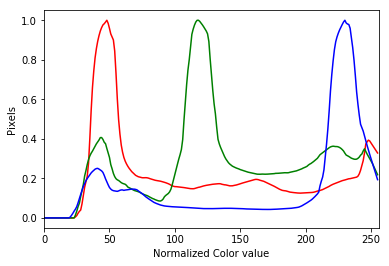

<Figure size 1440x720 with 0 Axes>

model 7: CocoPops Brown


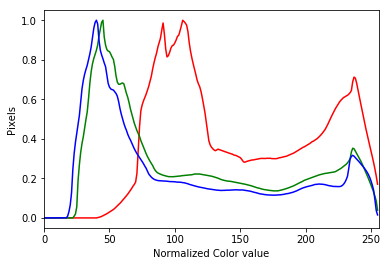

<Figure size 1440x720 with 0 Axes>

model 8: CocoPops Red


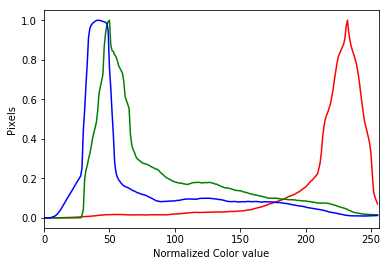

<Figure size 1440x720 with 0 Axes>

model 9: Special K blue
colore: 11.38 0.11 5.42 Brown: 0.45
model 10: Special K Brown
colore: 17.91 0.26 0.0 Brown: 20.61
model 20: Special K Red
colore: 40.09 0.0 0.0 Brown: 2.91
model 11: ChocoKrave Nocciole


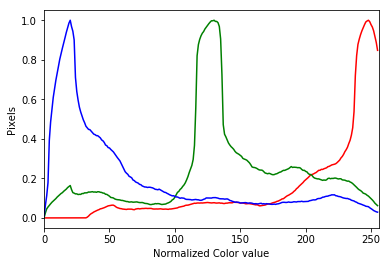

<Figure size 1440x720 with 0 Axes>

model 12: Fitness Orange
colore: 37.52 5.16 7.26 Brown: 0.33
model 13: Fitness Blue
colore: 6.66 4.2 33.21 Brown: 0.28
model 15: CocoPops Yellow


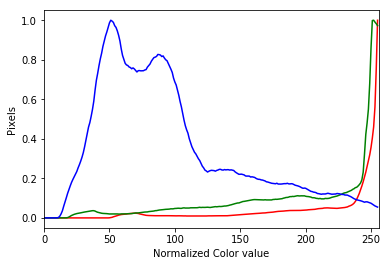

<Figure size 1440x720 with 0 Axes>

model 16: Miel Pops
colore: 1.71 6.03 0.0 Brown: 0.34
model 17: Miel Pops Orange
colore: 1.39 0.0 0.0 Brown: 0.1
model 18: Country crisp Brown


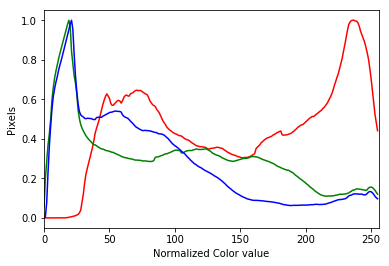

<Figure size 1440x720 with 0 Axes>

model 19: Country crisp Blue


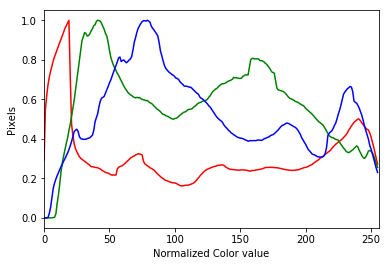

<Figure size 1440x720 with 0 Axes>

In [11]:
#Compute histograms of complex images

# tuples to select colors of each channel line
colors = ("r", "g", "b")
channel_ids = (0, 1, 2)

#models which has to be analysed wrt color
color_models=[1,7,8,9,10,20,11,12,13,15,16,17,18,19]
difficult_models=[12,13,9,10,20,16,17]

def find_region(height, width, model_number):
    if(model_number==1 or model_number==11):
        region_x=(0,int(height*2/3),width,height)
    if(model_number==9 or model_number==10 or model_number==20):
        region_x=(int(width*3/4),0,width,height)
    if(model_number==12 or model_number==13):
        region_x=(int(width/2),0,int(width*3/4),height)
    if(model_number==7 or model_number==8 or model_number==15):
        region_x=(0,int(height*3/8),width,int(height*5/8))
    if(model_number==16 or model_number==17):
        region_x=(0,int(height/2),int(width/2),int(height))
    if(model_number==18 or model_number==19):
        region_x=(0,int(height/3),width,int(height))
    return region_x

#filter parameters
eta = 20
beta = [1.0 / eta] * eta
alpha = 2

Regions_hist = defaultdict(list)
Regions_pixels = defaultdict(list)
for k in color_models:
    region=find_region(model[k].shape[0], model[k].shape[1], k)
    findmodel(k)
    #print(region[0],region[2], region[1],region[3])
    if(k not in difficult_models):
        #histograms computation
        plt.xlim([0, 256])
        for channel_id, c in zip(channel_ids, colors):
            histogram_1_noise, bin_edges = np.histogram(model[k][region[1]:region[3],region[0]:region[2],channel_id], bins=256, range=(0, 256))
            histogram_1 = lfilter(beta,alpha,histogram_1_noise)
            max_h=np.max(histogram_1)
            hist_1=histogram_1/max_h
            plt.plot(bin_edges[0:-1], hist_1, color=c)
            hist_1=np.float32(hist_1)
            Regions_hist[k].append(hist_1)

        plt.xlabel("Normalized Color value")
        plt.ylabel("Pixels")
        plt.figure(figsize=(20, 10))
        plt.show()
    else:
        #coloured pixels calculation
        counter_b_mod=find_colour(model[k], region[0],region[2],region[1],region[3], 2)
        counter_g_mod=find_colour(model[k], region[0],region[2],region[1],region[3], 1)
        counter_r_mod=find_colour(model[k], region[0],region[2],region[1],region[3], 0)
        counter_brown_mod=find_colour(model[k], region[0],region[2],region[1],region[3], 3)
        Regions_pixels[k].append(counter_r_mod)
        Regions_pixels[k].append(counter_g_mod)
        Regions_pixels[k].append(counter_b_mod)
        Regions_pixels[k].append(counter_brown_mod)
        
        print('colore:', counter_r_mod, counter_g_mod, counter_b_mod,'Brown:',counter_brown_mod)

In this part we can select a specific scene to analyse.

Available scenes are: 

h1, h2, h3, h4, h5 [step C]



In [76]:
scene_chosen = input("Write a scene among available ones and press enter:  ")

Write a scene among available ones and press enter:  h5


scenes/h5.jpg


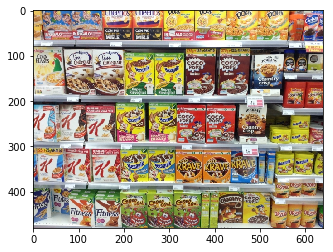

In [77]:
dirname = "scenes/"
img_name = dirname + scene_chosen + ".jpg"
print(img_name)

#Read the scene image
img_train = cv2.imread(img_name)

#conversion to original colours
scene = cv2.cvtColor(img_train,cv2.COLOR_BGR2RGB)
#gray version of the image
scene_gray = cv2.cvtColor(img_train, cv2.COLOR_BGR2GRAY)


#Code in order to show the train image
plt.imshow(scene, cmap='gray', vmin=0, vmax=255)
plt.show()

In [78]:
# Blur scene and Threshold it to get a Binary Image
gray = cv2.cvtColor(scene, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5,5), 0)
bw = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, -2)
cv2.imshow("Shelves", bw)
cv2.moveWindow("Shelves", 500, 0)
cv2.waitKey(3000)
cv2.destroyWindow("Shelves")

In [79]:
#Extract shelves' horizontal lines

horizontal = np.copy(bw)
# Specify size on horizontal axis
cols = horizontal.shape[1]
horizontal_size = cols //10
# Create structure element for extracting horizontal lines through morphology operations
horizontalStructure = cv2.getStructuringElement(cv2.MORPH_RECT, (horizontal_size, 1))
# Apply morphology operations
horizontal = cv2.erode(horizontal, horizontalStructure)
horizontal = cv2.dilate(horizontal, horizontalStructure)
horizontal = cv2.dilate(horizontal, horizontalStructure)
cv2.imshow("Horizontal Shelves", horizontal)
cv2.moveWindow("Horizontal Shelves", 500, 0)
cv2.waitKey(3000)
cv2.destroyWindow("Horizontal Shelves")


In [80]:
#extract all white pixels on a given vertical line
lista=[]
for j in range(scene.shape[0]):
    if horizontal[j, int(2*scene.shape[1]/3)]==255:
        lista.append(j)
print(lista)

#select coordinates of shelves: we search for thicker horizontal lines
lista_new=[]
for first in range(len(lista)):
    if (lista[first] != 0):
        sum_b = lista[first]
        count_b = 1
        next_index=first+1
        previous=lista[first]
        for second in range(next_index,len(lista)):
            if(lista[second]-previous==1):
                sum_b=sum_b+lista[second]
                count_b += 1
                previous=lista[second]
                lista[second]=0
            else:
                continue
        sum_b=int(round(sum_b/count_b))
        if count_b > 5:
            lista_new.append(sum_b)    
    
print(lista_new)

[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 94, 95, 98, 99, 189, 190, 191, 192, 193, 194, 195, 196, 201, 202, 203, 217, 218, 219, 220, 294, 295, 296, 297, 298, 299, 300, 307, 308, 382, 383, 384, 385, 386, 387, 388, 396, 397, 398, 470, 471, 472, 473, 474, 475, 476, 477]
[74, 192, 297, 385, 474]


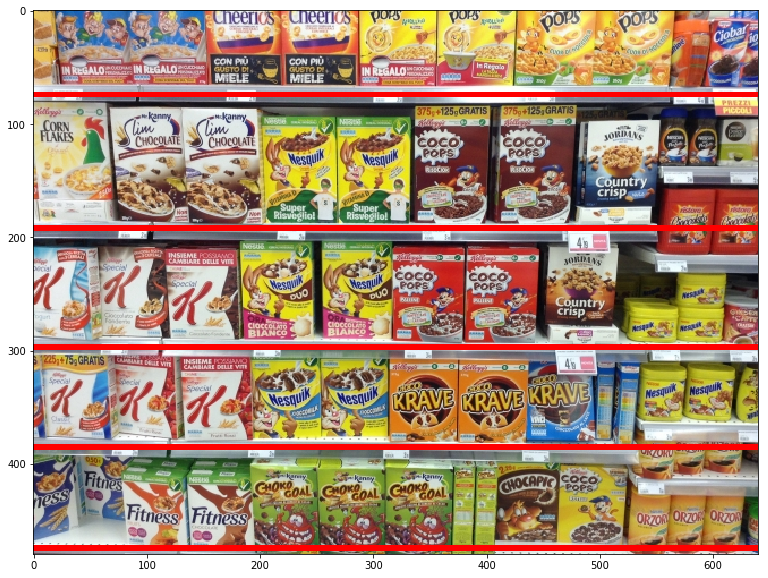

In [81]:
#Visualization of shelves position
scene_copy=scene.copy()

for k in lista_new:
    cv2.line(scene_copy,(0,k),(scene.shape[1],k), (255,0,0),3)
plt.figure(figsize=(20, 10))
plt.imshow(scene_copy)
plt.show()


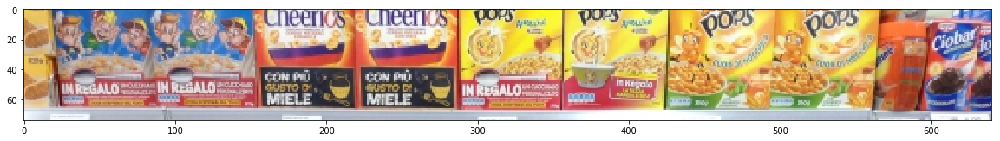

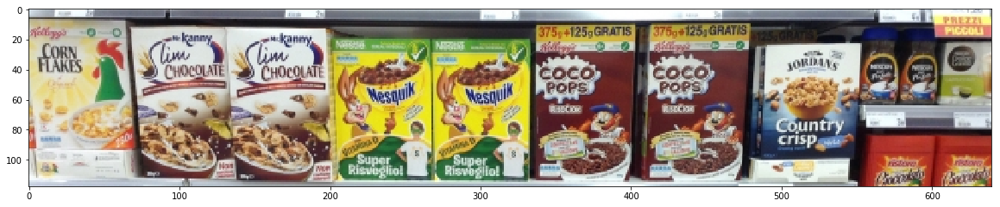

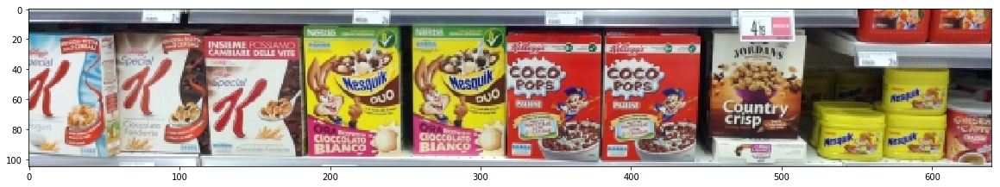

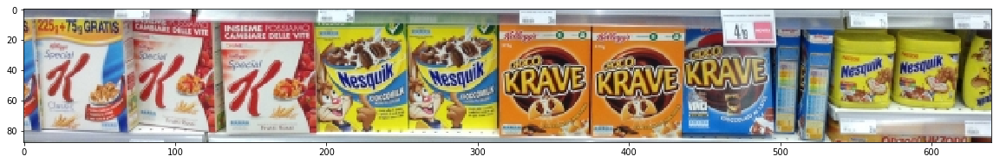

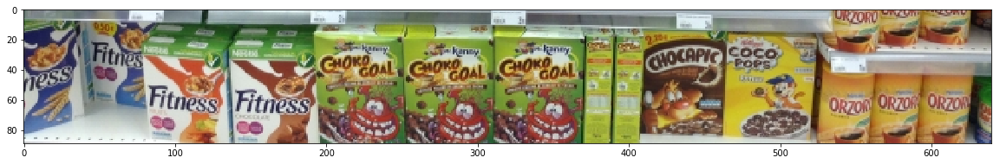

In [82]:
#crop the scene image into pieces containing one line of boxes
#areas which are too little to be relevant are kept for later, in order to reconstruct the bigger image
x_crop=[[]]*len(lista_new)

for i in range(len(lista_new)):
    x_crop[i]=[lista_new[i],1]

slice_left=[]

#condition to keep first cropped part
if lista_new[0]<50:
    slice_left.append(scene[0:lista_new[0], 0:scene.shape[1]])
    start_point=lista_new[0]
    lista_new.remove(lista_new[0])
    x_crop[0][1]=0
else: 
    start_point=0

#condition to keep last cropped part
if abs(lista_new[len(lista_new)-1]-scene.shape[0])<30:
    slice_left.append( scene[lista_new[len(lista_new)-1]:scene.shape[0], 0:scene.shape[1]])
    end_point=lista_new[len(lista_new)-1]
    lista_new.remove(lista_new[len(lista_new)-1])
    x_crop[-1][1]=0
else:
    end_point=scene.shape[0]

#crop the image into slices
crop_img=[[]]*(len(lista_new)+1)

for k in range(len(lista_new)+1):
    if k==0:
        start=start_point
    else:
        start=lista_new[k-1]
    if k==len(lista_new):
        end=end_point
    else:
        end=lista_new[k]
    crop_img[k] = scene[start:end, 0:scene.shape[1]]

#show cropped images   
for k in range(len(crop_img)):
    plt.figure(figsize=(20, 10))
    plt.imshow(crop_img[k])
    plt.show()

In [83]:
# Copy of the gray models
model_gray_x = [model_gray[i].copy() for i in range(n_model)]

# Gray Image for each shelf
crop_img_gray = [cv2.cvtColor(crop_img[i],cv2.COLOR_BGR2GRAY) for i in range(len(crop_img))]

# Initiate SIFT detector
sift = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with SIFT (Models)
kp_model = [sift.detect(model_gray_x[i]) for i in range(n_model)]
            
# find the keypoints and descriptors with SIFT (each shelf)
kp_train = [sift.detect(crop_img_gray[i]) for i in range(len(crop_img))]

# Describing keypoints for query and train images
kp_des_model=[[]]*n_model
kp_des_train=[[]]*len(crop_img)
            
for i in range(n_model):
    kp_model[i], kp_des_model[i] = sift.compute(model_gray_x[i], kp_model[i])
    
for i in range(len(crop_img)):
    kp_train[i], kp_des_train[i] = sift.compute(crop_img_gray[i], kp_train[i])

# Defining index for approximate kdtree algorithm
FLANN_INDEX_KDTREE = 1

# Defining parameters for algorithm 
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

# Defining search params.
# checks=50 specifies the number of times the trees in the index should be recursively traversed.
# Higher values gives better precision, but also takes more time
search_params = dict(checks = 50)

# Initializing matcher
flann = cv2.FlannBasedMatcher(index_params,search_params)

model 0: Nesquik Azzurro


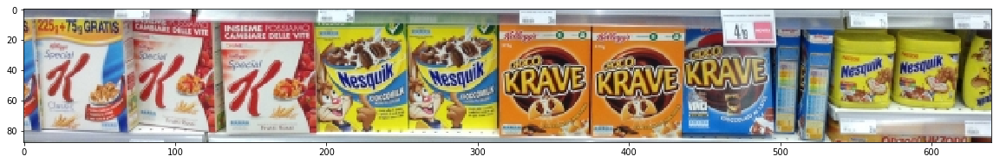

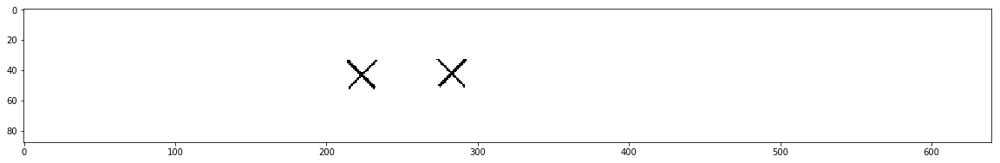

barycentres found: [[42, 283], [43, 223]]
model 1: ChocoKrave al latte


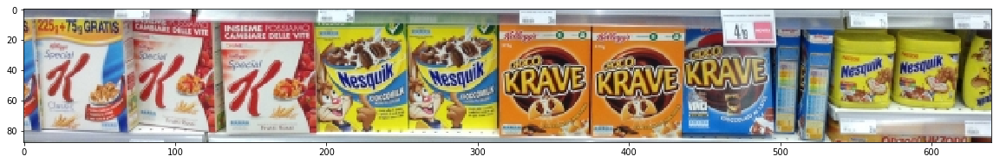

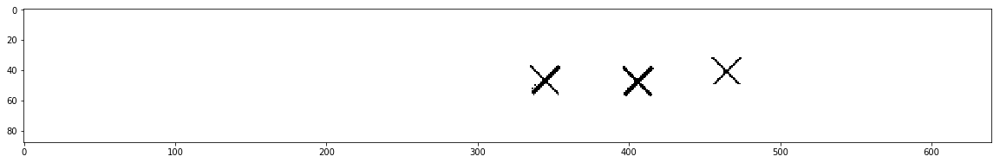

barycentres found: [[41, 464], [47, 344], [48, 406]]
model 2: Corn Flakes
model 3: Choko Goal


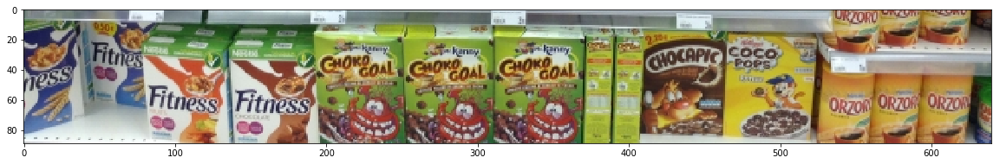

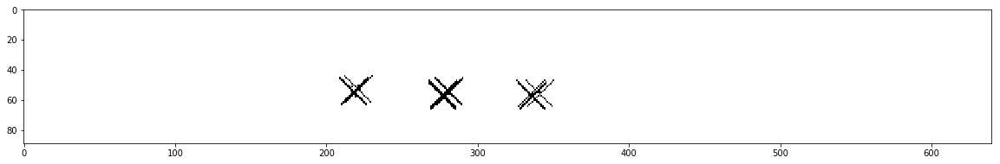

barycentres found: [[54, 219], [56, 279], [56, 338]]
model 4: Lim Chocolate


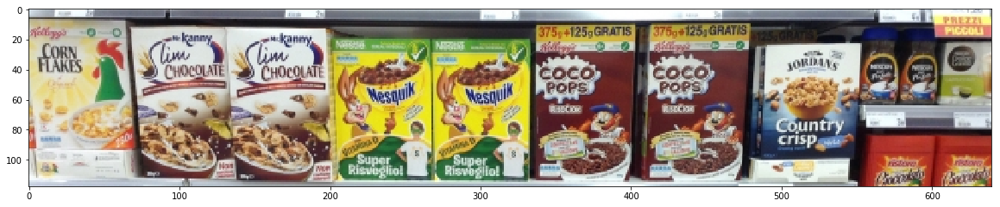

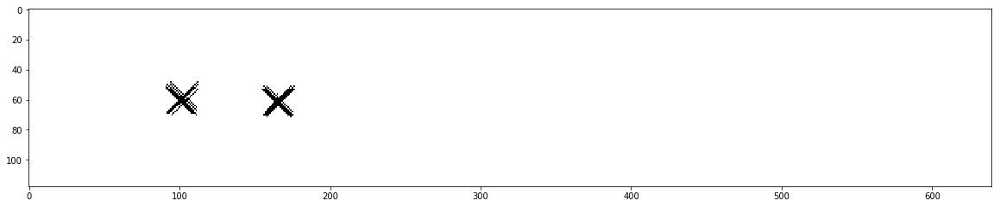

barycentres found: [[60, 102], [62, 166]]
model 5: Nesquik Giallo


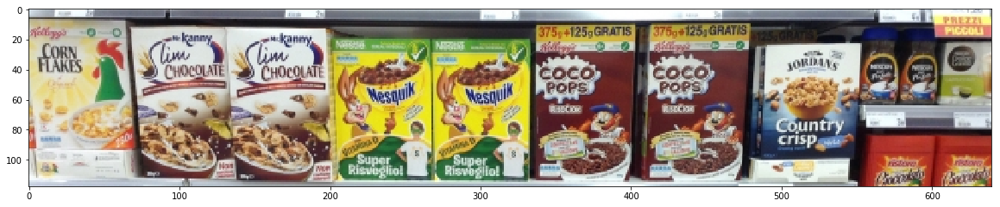

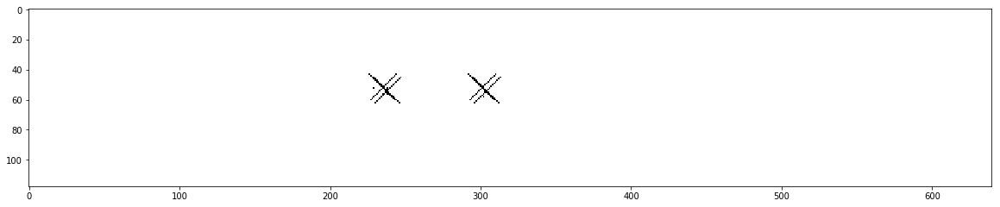

barycentres found: [[53, 236], [54, 302]]
model 6: Nesquik Duo


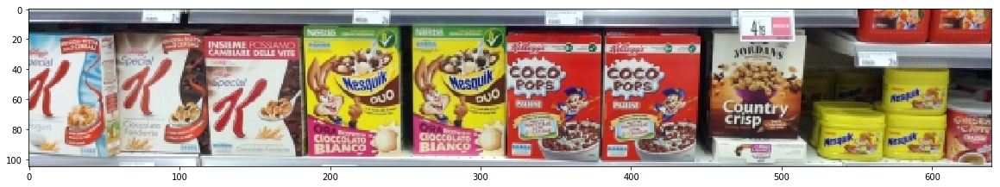

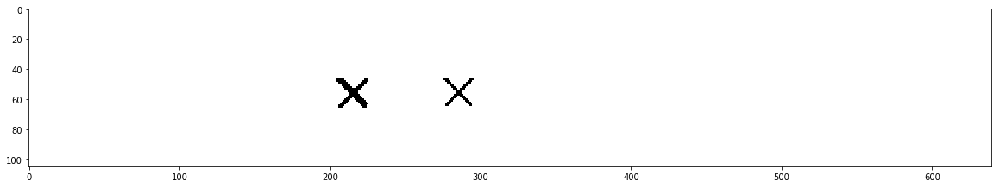

barycentres found: [[56, 215], [56, 285]]
model 7: CocoPops Brown


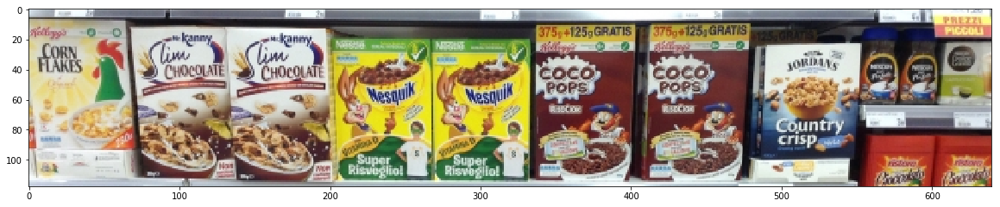

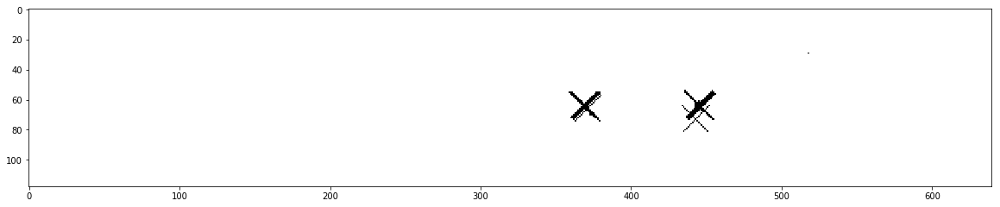

barycentres found: [[66, 445], [65, 370]]


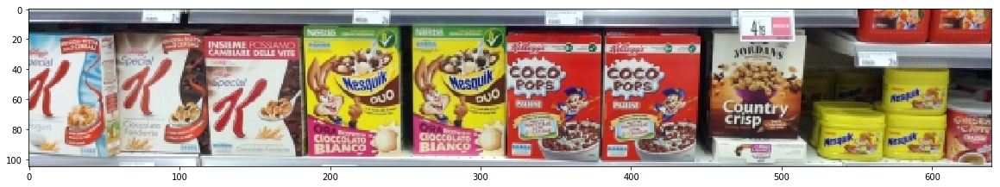

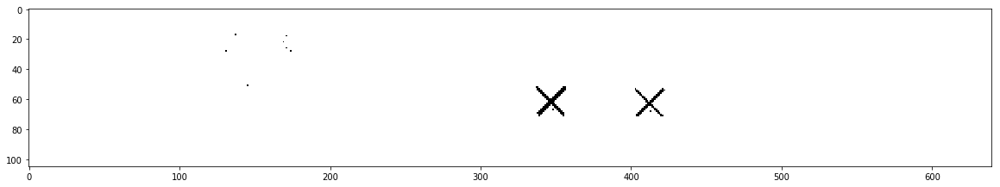

barycentres found: [[62, 347], [63, 412]]


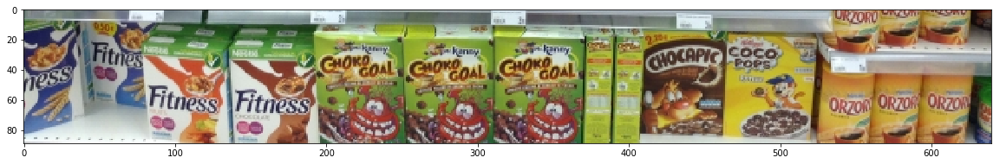

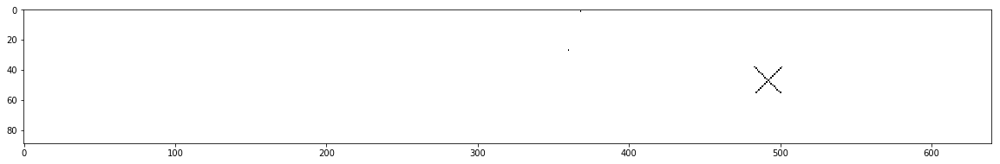

barycentres found: [[47, 492]]
model 8: CocoPops Red


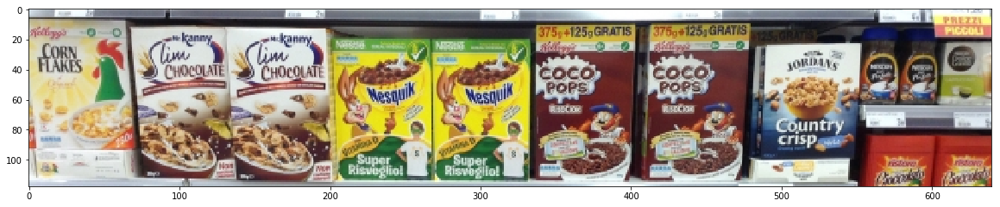

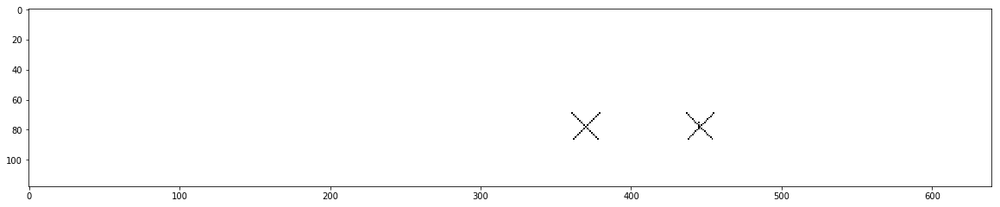

barycentres found: [[78, 370], [78, 446]]


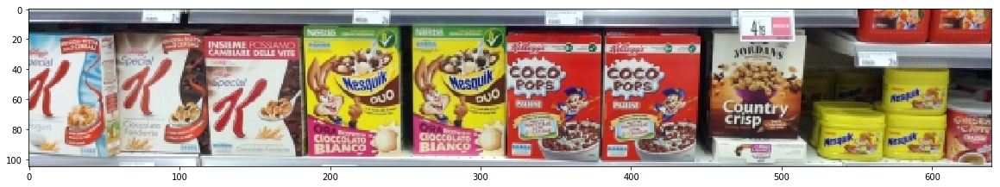

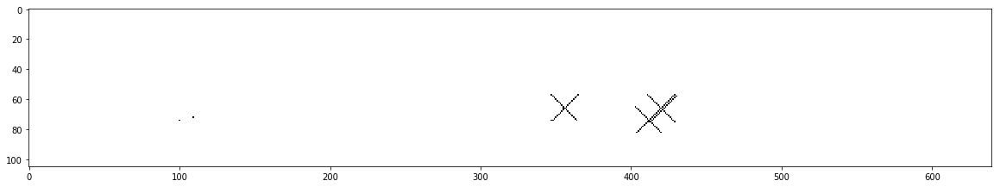

barycentres found: [[66, 356], [69, 418]]
model 9: Special K blue


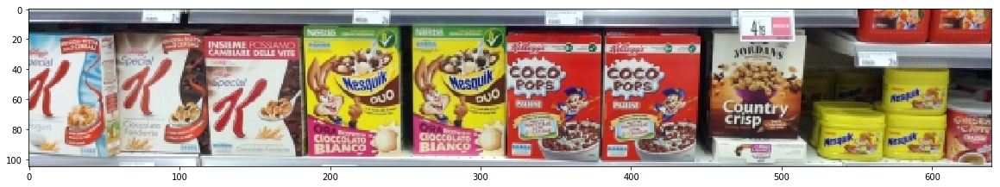

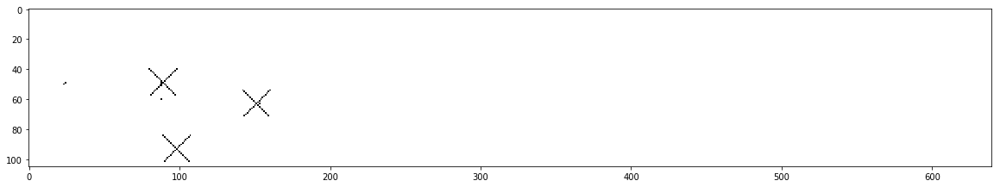

barycentres found: [[49, 89], [63, 151], [93, 98]]


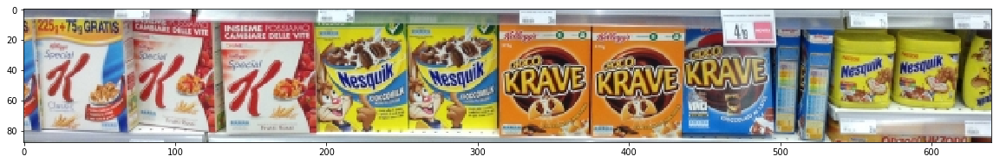

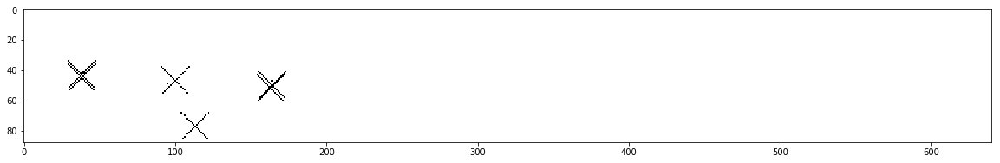

barycentres found: [[44, 38], [47, 100], [51, 164], [77, 113]]


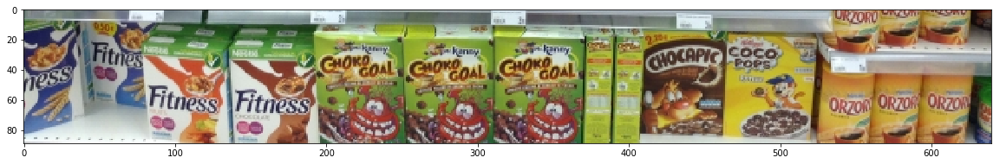

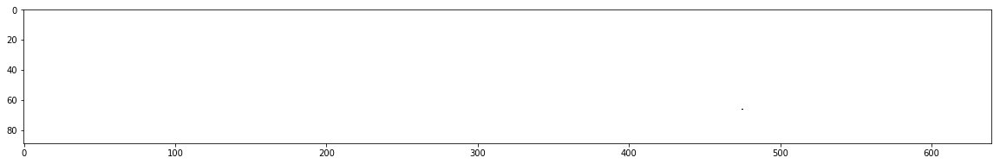

barycentres found: []
model 10: Special K Brown


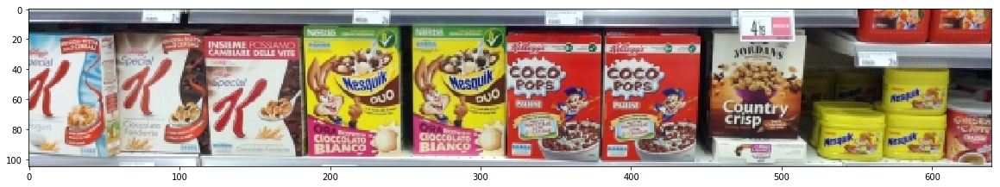

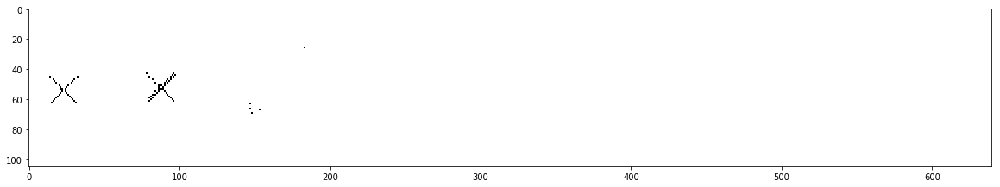

barycentres found: [[52, 88], [54, 23], [67, 150]]


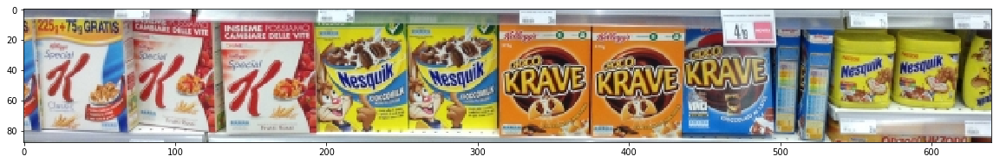

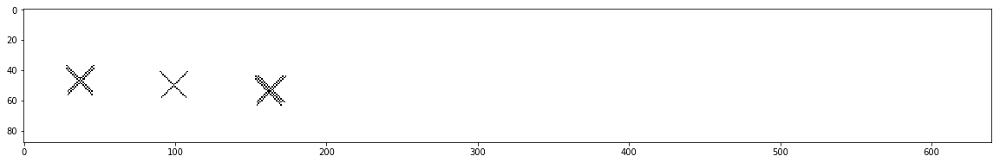

barycentres found: [[47, 37], [50, 99], [54, 163]]
model 11: ChocoKrave Nocciole


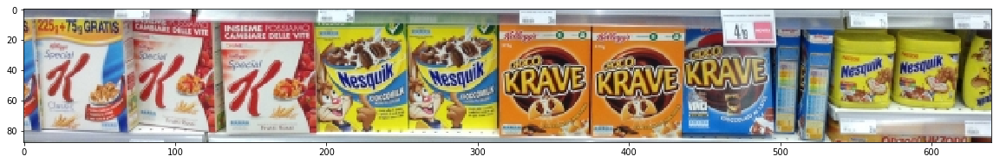

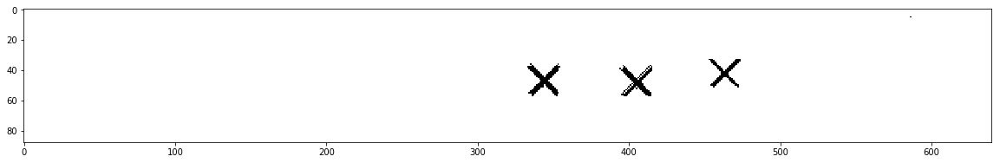

barycentres found: [[42, 463], [48, 343], [48, 405]]
model 12: Fitness Orange


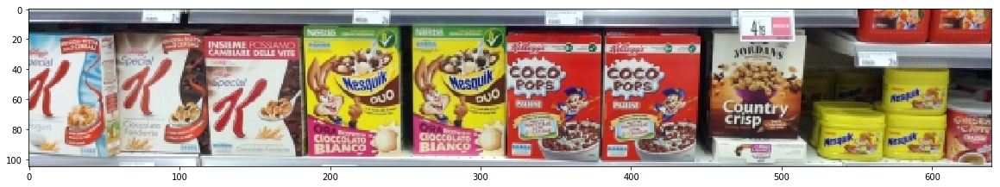

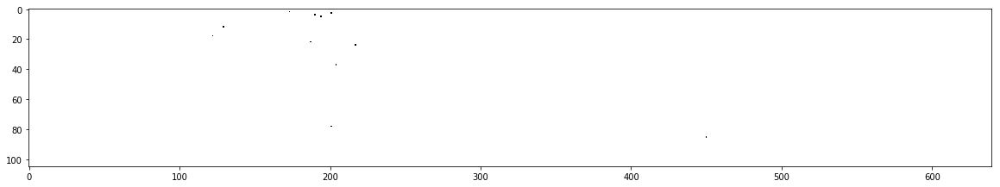

barycentres found: []


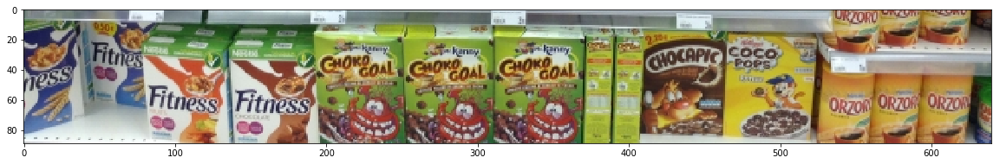

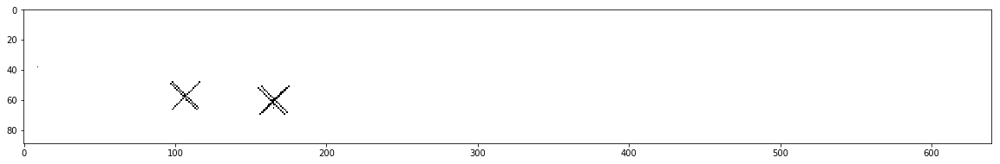

barycentres found: [[58, 106], [60, 165]]
model 13: Fitness Blue
model 14: Chocapic


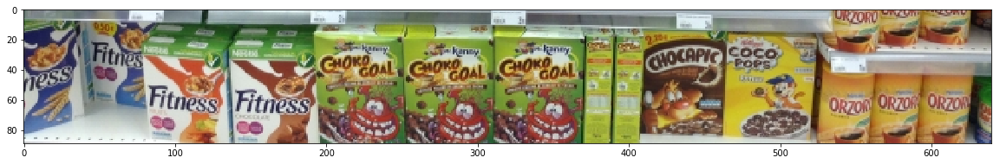

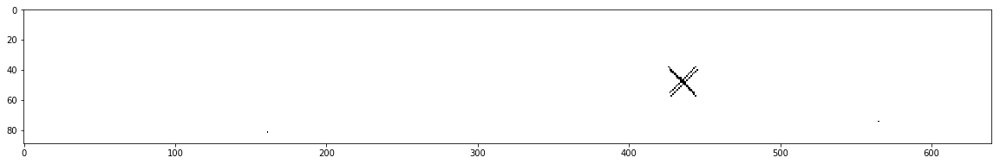

barycentres found: [[48, 436]]
model 15: CocoPops Yellow


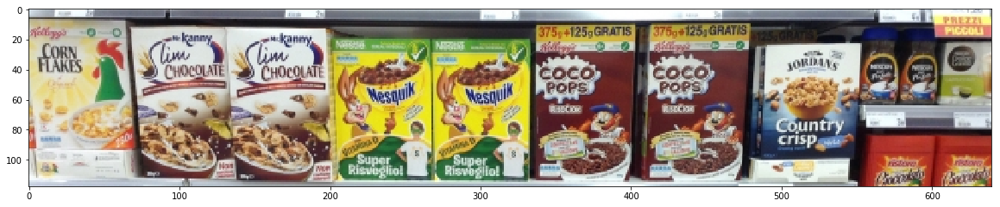

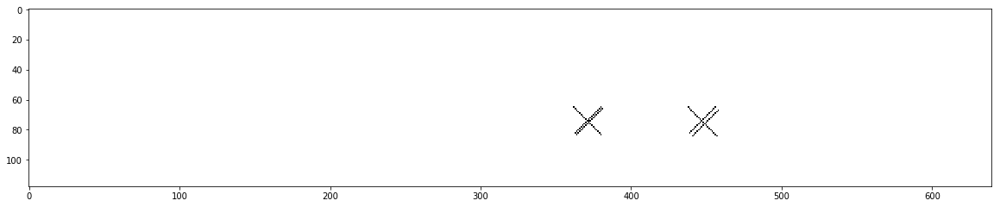

barycentres found: [[74, 372], [75, 448]]


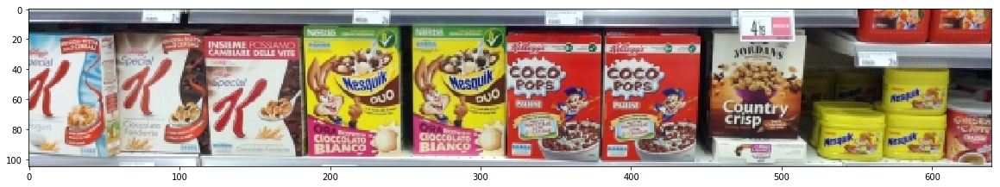

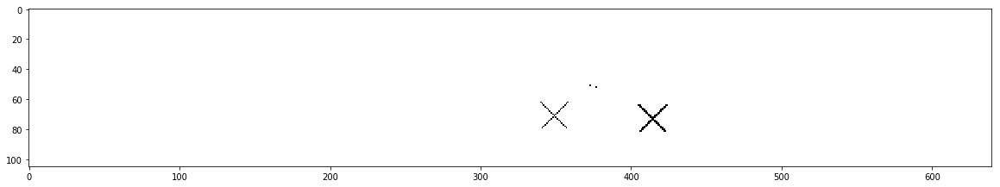

barycentres found: [[71, 349], [73, 414]]


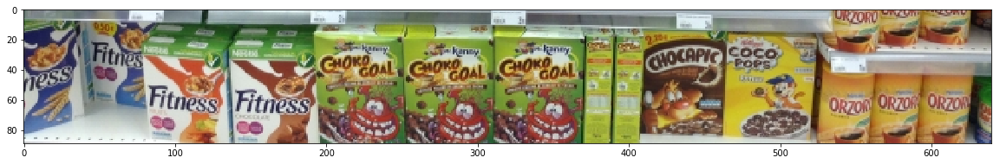

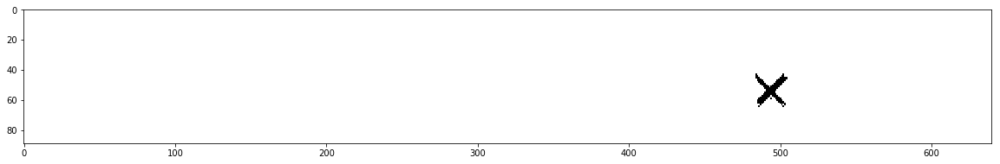

barycentres found: [[54, 494]]
model 16: Miel Pops


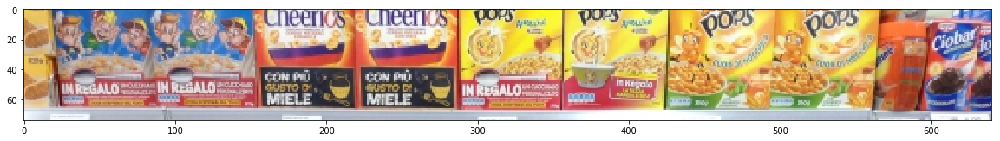

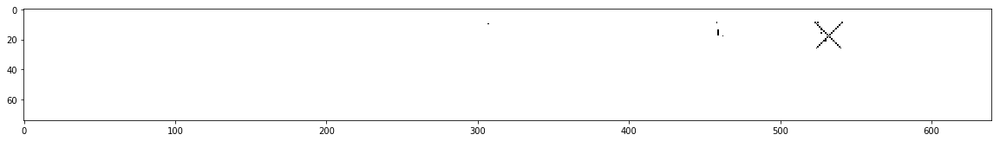

barycentres found: [[18, 532], [16, 460]]
model 17: Miel Pops Orange


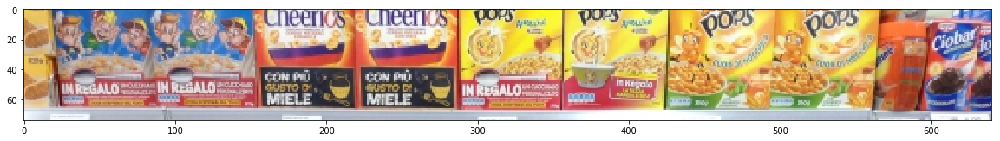

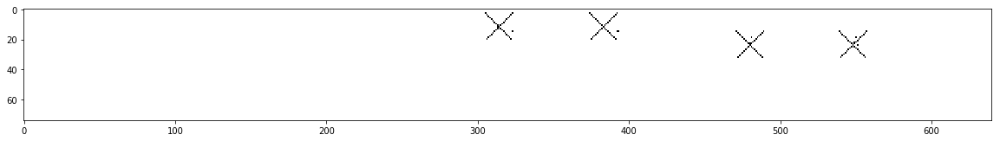

barycentres found: [[12, 314], [12, 383], [24, 480], [24, 548]]
model 18: Country crisp Brown


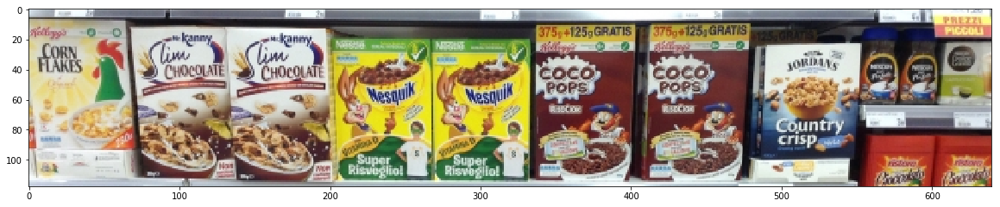

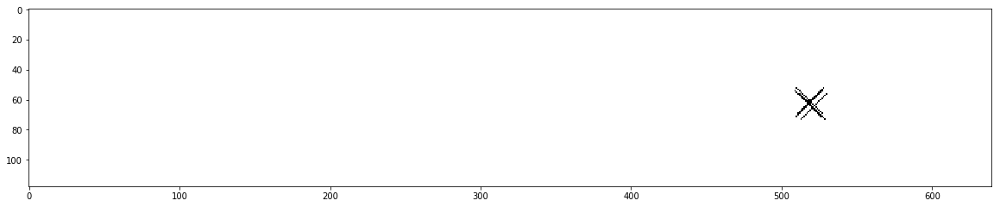

barycentres found: [[63, 519]]


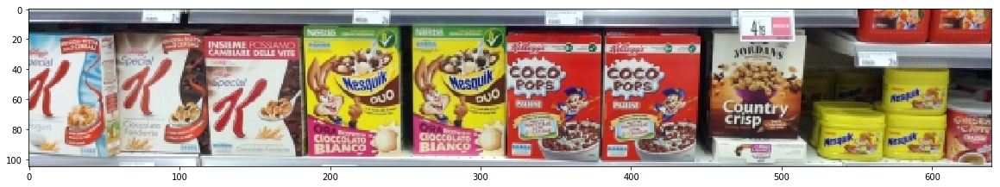

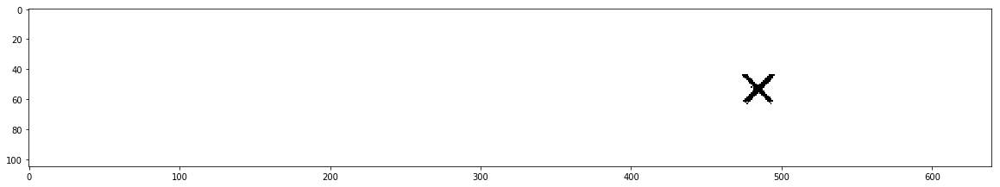

barycentres found: [[53, 484]]
model 19: Country crisp Blue


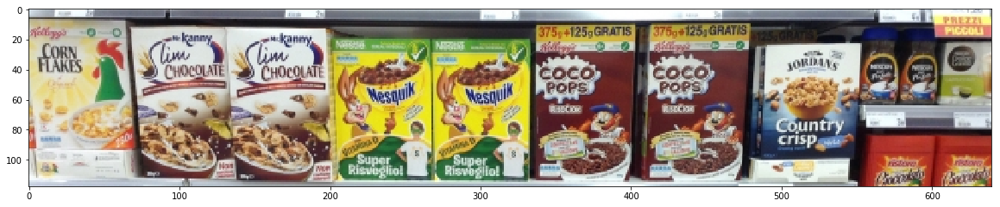

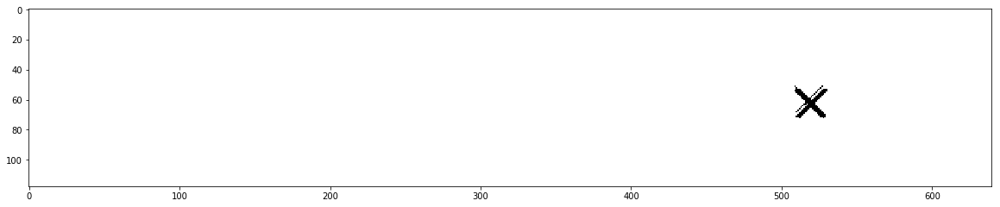

barycentres found: [[62, 520]]
model 20: Special K Red


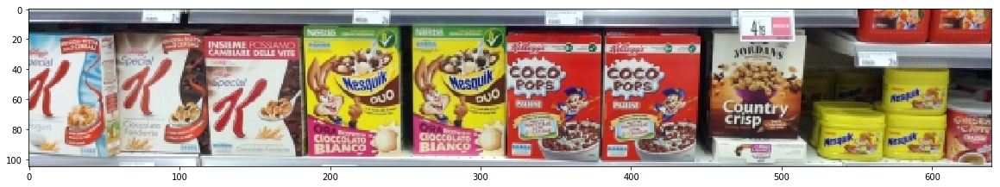

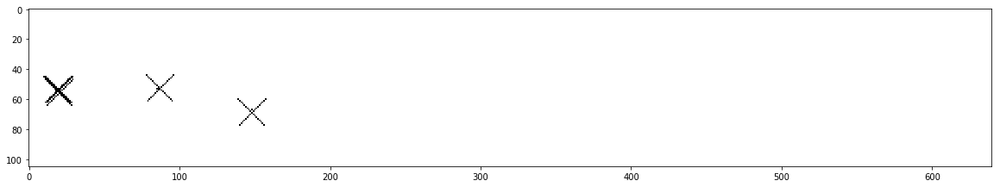

barycentres found: [[53, 87], [55, 20], [69, 148]]


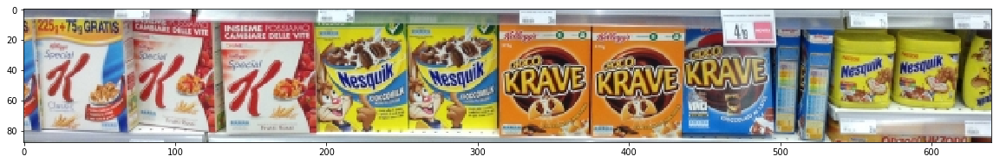

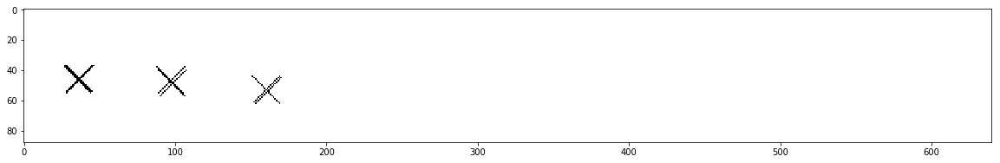

barycentres found: [[46, 36], [48, 98], [54, 160]]
model 21: Rice Krispies
model 22: Cheerios


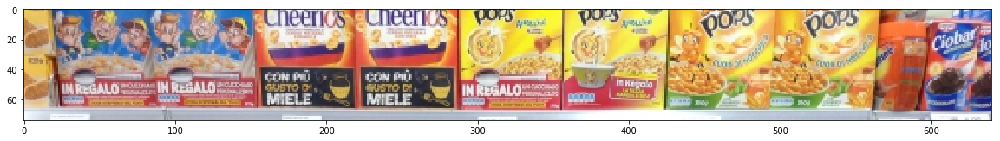

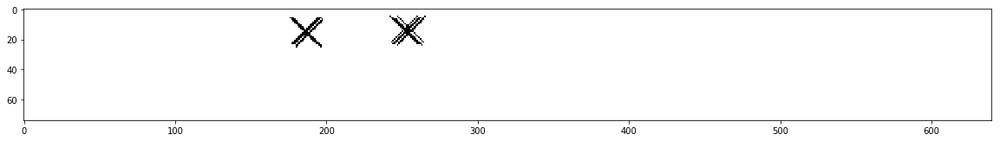

barycentres found: [[15, 253], [16, 187]]


In [84]:
#initialise all needed structures
src_pts_array = [[]]*n_model
dst_pts_array = [[]]*n_model
good_array = [[]]*n_model
first_filtered_bar_array = [[]]*n_model
r_table_array = [[]]*n_model

for i in range(n_model):
    src_pts_array[i] = [[]]*len(crop_img)
    dst_pts_array[i] = [[]]*len(crop_img)
    good_array[i] = [[]]*len(crop_img)
    first_filtered_bar_array[i] = [[]]*len(crop_img)
    r_table_array[i] = [[]]*len(crop_img)
    
model_bar = [[]]* n_model
    

for i in range(n_model):
    model_bar[i]=(model_gray_x[i].shape[0]//2, model_gray_x[i].shape[1]//2)
    findmodel(i)
    
    for k in range(len(crop_img)):
        #compute 4 possible matches for each keypoint
        matches_list = flann.knnMatch(kp_des_model[i],kp_des_train[k],k=4)
        good=[]
        #select only matches with low distance
        for m,n,o,p in matches_list:
            if m.distance < 200:
                good.append(m)
            if n.distance < 200:
                good.append(n)
            if o.distance < 200:
                good.append(o)
            if p.distance < 200:
                good.append(p)
                
        good_array[i][k]=good
 
        if len(good)>7:
            #keep track of keypoints' coordinates and size
            src_pts = np.array([(kp_model[i][m.queryIdx].pt, kp_model[i][m.queryIdx].size) for m in good ])
            dst_pts = np.array([(kp_train[k][m.trainIdx].pt, kp_train[k][m.trainIdx].size) for m in good ])
        
            src_pts_array[i][k] = src_pts
            dst_pts_array[i][k] = dst_pts
            
            #draw all good matches found
            ##img_test = cv2.drawMatches(model_gray_x[i],kp_model[i],crop_img_gray[k],kp_train[k],good, None,singlePointColor = None, flags = 2)
            ##plt.figure(figsize=(20, 10))
            ##plt.imshow(img_test, 'gray')
            ##plt.show()
        
            #define table and accumulator, then plot this last one compared to the reference cropped image
            r_table_model=build_r_table(model_bar[i],src_pts)
            accumulator_set=accumulate_kp(r_table_model,crop_img_gray[k],dst_pts)
            r_table_array[i][k]=r_table_model
            plt.figure(figsize=(20, 10))
            plt.imshow(crop_img[k])
            plt.show()

            barycentres_list=plot_accumulator(accumulator_set, crop_img_gray[k])
            #print(barycentres_list)
            barycentres_list=count_bar(barycentres_list, accumulator_set,3)
            #print(barycentres_list)
            
            #filter obtained baricetres
            first_filtered_bar=distance_filter(barycentres_list,20)
            first_filtered_bar_array[i][k] = first_filtered_bar
            print('barycentres found:', first_filtered_bar)
        else:
            src_pts_array[i][k] = 0
            dst_pts_array[i][k] = 0


model 0: Nesquik Azzurro
Position:  (283, 339) Width:  57 px Height:  77 px
Position:  (223, 340) Width:  57 px Height:  77 px
number of instances found: 2
model 1: ChocoKrave al latte
Position:  (464, 338) Width:  58 px Height:  77 px
number of instances found: 1
model 2: Corn Flakes
number of instances found: 0
model 3: Choko Goal
Position:  (219, 439) Width:  62 px Height:  74 px
Position:  (279, 441) Width:  60 px Height:  71 px
Position:  (338, 441) Width:  62 px Height:  72 px
number of instances found: 3
model 4: Lim Chocolate
Position:  (102, 134) Width:  63 px Height:  100 px
Position:  (166, 136) Width:  66 px Height:  105 px
number of instances found: 2
model 5: Nesquik Giallo
Position:  (236, 127) Width:  48 px Height:  72 px
Position:  (302, 128) Width:  50 px Height:  75 px
number of instances found: 2
model 6: Nesquik Duo
Position:  (215, 248) Width:  61 px Height:  85 px
Position:  (285, 248) Width:  61 px Height:  84 px
number of instances found: 2
model 7: CocoPops Br

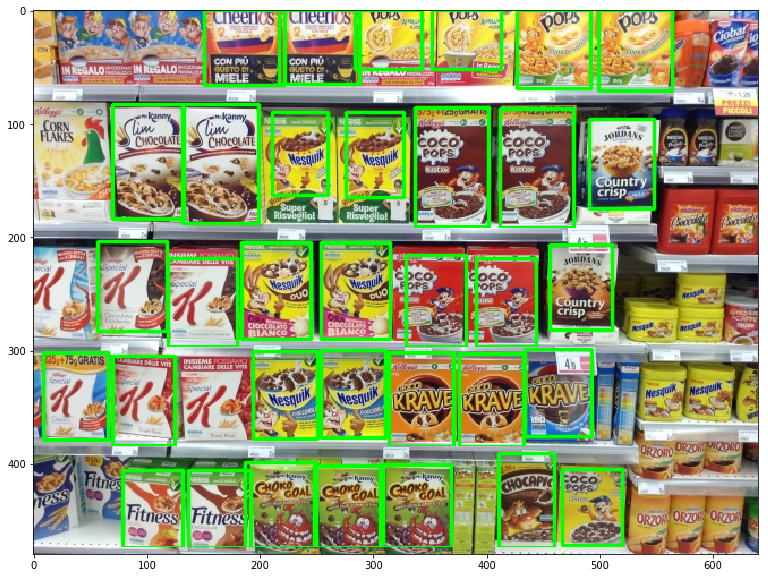

In [85]:
crop_copy=[[]]*len(crop_img)

for i in range(len(crop_img)):
    crop_copy[i]=crop_img[i].copy()

counter_instance=0
#double asterisc lines are for visualization
for i in range(n_model):
    if(i!=0):
        print('number of instances found:',counter_instance)
    counter_instance=0
    findmodel(i)
    for k in range(len(crop_img)):
        dst_pts=dst_pts_array[i][k]
        good=good_array[i][k]
        if not src_pts_array[i][k] is int:
            
            final_good=[[]]*len(first_filtered_bar_array[i][k])
            for j in range(len(first_filtered_bar_array[i][k])):
                final_good[j]=find_correct_keypoints(first_filtered_bar_array[i][k][j],dst_pts,r_table_array[i][k],good,crop_img_gray[k], 30)

                src_pts_size = np.float32([ kp_model[i][m.queryIdx].size for m in final_good[j]])
                dst_pts_size = np.float32([ kp_train[k][m.trainIdx].size for m in final_good[j]])
                
                #build a bounding box wrt ratio of keypoints sizes
                ratio=np.mean(dst_pts_size)/np.mean(src_pts_size)
                a=first_filtered_bar_array[i][k][j][0]-ratio*(model_gray_x[i].shape[0]/2)
                b=first_filtered_bar_array[i][k][j][1]-ratio*(model_gray_x[i].shape[1]/2)
                c=first_filtered_bar_array[i][k][j][0]+ratio*(model_gray_x[i].shape[0]/2)
                d=first_filtered_bar_array[i][k][j][1]+ratio*(model_gray_x[i].shape[1]/2)
                if a<0:
                    a=0
                if c>crop_copy[k].shape[0]:
                    c=crop_copy[k].shape[0]
                dst= np.float32([[b,a],[d,a],[d,c],[b,c]]).reshape(-1,1,2)
                
                #compute box info
                width_box=int(abs(b-d))
                height_box=int(abs(a-c))
                centre=(first_filtered_bar_array[i][k][j][1],first_filtered_bar_array[i][k][j][0])
                total_centre=find_total_centre(centre,k)
                
                if i in color_models:
                    #find out window of interest for models which need color control
                    region_shelf=find_region(height_box, width_box, i)
                    x_start=int(b+region_shelf[0])
                    y_start=int(a+region_shelf[1])
                    x_end=int(d-width_box+region_shelf[2])
                    y_end=int(c-height_box+region_shelf[3])     
                    dst_region=np.float32([ [x_start,y_start],[x_end,y_start],[x_end, y_end],[x_start, y_end]]).reshape(-1,1,2)
                    
                    #Visualization: print reference model and sub_area of the scene to be compared
                    ##f, axarr = plt.subplots(1,2)
                    ##axarr[0].imshow(crop_img[k][y_start: y_end,x_start: x_end])
                    ##axarr[1].imshow(model[i])
                    ##plt.show()

                    #models which can be generally classified according to their histograms
                    if i not in difficult_models:
                        #filter parameters
                        eta = 20
                        beta = [1.0 / eta] * eta
                        alpha = 2
                        rgb_hist=[] #histograms list(rgb)
                        #histograms computation on chosen windows
                        for channel_id, c in zip(channel_ids, colors):
                            histogram_w_noise, bin_edges = np.histogram(crop_img[k][y_start: y_end,x_start: x_end,channel_id], bins=256, range=(0, 256))
                            histogram_w = lfilter(beta,alpha,histogram_w_noise)
                            #find out histogram max to normalize it
                            max_w=np.max(histogram_w)
                            hist_w=histogram_w/max_w
                            ##plt.plot(bin_edges[0:-1], hist_w, color=c)
                            hist_w=np.float32(hist_w)
                            #append the found histogram in the histogram list
                            rgb_hist.append(hist_w)
                        
                        ##print('model:', i)
                        ##plt.xlim([0, 256])
                        ##plt.xlabel("Normalized Color value")
                        ##plt.ylabel("Pixels")
                        ##plt.figure(figsize=(20, 10))
                        ##plt.show()

                        max_index_mod=[[]]*3
                        max_index_w=[[]]*3

                        for channel, c in zip(channel_ids, colors):
                            #compute position of max values of reference histogram and new histogram
                            max_mod=np.max(Regions_hist[i][channel])
                            max_w=np.max(rgb_hist[channel])
                            max_index_mod[channel]=[index for index in range(256) if Regions_hist[i][channel][index]==max_mod]
                            max_index_w[channel]=[index for index in range(256) if rgb_hist[channel][index]==max_w]
                       
                        #compute order of peaks (in terms of rgb)
                        max_index_mod_sort= sorted(max_index_mod)
                        max_index_w_sort= sorted(max_index_w)
                        max_index_mod_sort=find_channels(max_index_mod_sort, max_index_mod)
                        max_index_w_sort=find_channels(max_index_w_sort, max_index_w)
                        
                        check=False
                        if max_index_mod_sort== max_index_w_sort: 
                            check=True
                        
                        #check condition to recognize boxes (if peaks are not too distant, or if they are but they mantain the same order)
                        if((abs(max_index_mod[0][0]-max_index_w[0][0])<45  and abs(max_index_mod[1][0]-max_index_w[1][0])<45 
                            and abs(max_index_mod[2][0]-max_index_w[2][0])<45) or (abs(max_index_mod[0][0]-max_index_w[0][0])<70
                                and abs(max_index_mod[1][0]-max_index_w[1][0])<70 and abs(max_index_mod[2][0]-max_index_w[2][0])<70 and check)):
                            #visual of color window
                            cv2.polylines(crop_copy[k],[np.int32(dst)],True,(0,255,0),2, cv2.LINE_AA)
                            print("Position: ", total_centre, "Width: ", width_box, "px Height: ", height_box, "px")
                            counter_instance+=1
                    else:
                    #models which can be classified with direct colour check
                        #compute number of almost blue, green, red, brown pixels
                        counter_b=find_colour(crop_img[k], x_start,x_end,y_start,y_end, 2)
                        counter_g=find_colour(crop_img[k], x_start,x_end,y_start,y_end, 1)
                        counter_r=find_colour(crop_img[k], x_start,x_end,y_start,y_end, 0)
                        counter_brown=find_colour(crop_img[k], x_start,x_end,y_start,y_end, 3)
                        #print('colore:', counter_r, counter_g, counter_b,'Brown:',counter_brown)
                        #print('colore modello:',Regions_pixels[i][0],Regions_pixels[i][1],Regions_pixels[i][2],'Brown:',Regions_pixels[i][3])
                        
                        #check if conditions to identify model are satisfied
                        #set all initial errors to 5% plus a part correlated to number of pixels found
                        limit_per_r=5+counter_r//10
                        limit_per_g=5+counter_g//10
                        limit_per_b=5+counter_b//10
                        limit_brown=5+counter_brown//10
                        
                        #brown adjustment
                        if(i==10):
                            limit_per_r=12
                            limit_brown=15
                        #miel pops anellini error adjustment
                        if(i==17):
                            limit_per_r=20
                            limit_per_g=1
                        #fitness error adjustment
                        if(i==12 or i==13):
                            limit_per_r=25
                            limit_per_b=25
                            limit_per_g=25
                        
                        #check condition to recognize boxes
                        if((abs(counter_r-Regions_pixels[i][0])<limit_per_r and abs(counter_g-Regions_pixels[i][1])<limit_per_g and
                            abs(counter_b-Regions_pixels[i][2])<limit_per_b and  abs(counter_brown-Regions_pixels[i][3])<limit_brown)):
                            print_ok=True
                        #print('accepted:',print_ok)
                        
                        if print_ok:
                            print_ok=False
                            cv2.polylines(crop_copy[k],[np.int32(dst)],True,(0,255,0),2, cv2.LINE_AA)
                            print("Position: ", total_centre, "Width: ", width_box, "px Height: ", height_box, "px")
                            counter_instance+=1
                else:
                #in case of models not color dependent
                    cv2.polylines(crop_copy[k],[np.int32(dst)],True,(0,255,0),2, cv2.LINE_AA)
                    print("Position: ", total_centre, "Width: ", width_box, "px Height: ", height_box, "px")
                    counter_instance+=1
print('number of instances found:',counter_instance)
#code for single crop images visualization
##for k in range(len(crop_img)):
   ## plt.figure(figsize=(20, 10))
   ## plt.imshow(crop_copy[k])
   ## plt.show()

#code for final image visualization
final_image=[]
if (x_crop[0][1]==0):
    final_image.append(slice_left[0])
for k in range(len(crop_img)):
    final_image.append(crop_copy[k])    
if (x_crop[-1][1]==0 and x_crop[0][1]==1):
    final_image.append(slice_left[0])
if(x_crop[-1][1]==0 and x_crop[0][1]==0):
    final_image.append(slice_left[1])
    
im_v = cv2.vconcat(final_image)
plt.figure(figsize=(20, 10))
plt.imshow(im_v)
plt.show()